In [ ]:
import kagglehub
crawford_vgg16_path = kagglehub.dataset_download('crawford/vgg16')
paultimothymooney_chest_xray_pneumonia_path = kagglehub.dataset_download('paultimothymooney/chest-xray-pneumonia')
eisgandar_pneumonia_lungs_path = kagglehub.dataset_download('eisgandar/pneumonia-lungs')
eisgandar_pneumonia_lung_image_for_test_path = kagglehub.dataset_download('eisgandar/pneumonia-lung-image-for-test')

print('Data source import complete.',crawford_vgg16_path)
print('Data source .',paultimothymooney_chest_xray_pneumonia_path)
print('Data source .',eisgandar_pneumonia_lungs_path)

print('Data source .',eisgandar_pneumonia_lung_image_for_test_path )

100%|██████████| 542M/542M [00:27<00:00, 20.4MB/s]

Extracting files...


100%|██████████| 2.29G/2.29G [01:45<00:00, 23.4MB/s]

Extracting files...


100%|██████████| 6.39k/6.39k [00:00<00:00, 14.6MB/s]

Extracting files...


100%|██████████| 34.5k/34.5k [00:00<00:00, 1.75MB/s]

Extracting files...
Data source import complete. /root/.cache/kagglehub/datasets/crawford/vgg16/versions/2
Data source . /root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2
Data source . /root/.cache/kagglehub/datasets/eisgandar/pneumonia-lungs/versions/1
Data source . /root/.cache/kagglehub/datasets/eisgandar/pneumonia-lung-image-for-test/versions/1


In [ ]:
import os
dataset_path = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/"
if not os.path.exists(dataset_path):
    raise Exception(f"Dataset path does not exist: {dataset_path}")
else:
    print(f"Dataset found at: {dataset_path}")


Dataset found at: /root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/


In [ ]:
train_dir = os.path.join(dataset_path, 'train')
test_dir = os.path.join(dataset_path, 'test')
val_dir = os.path.join(dataset_path, 'val')

In [ ]:
print(train_dir)
print(test_dir)
print(val_dir)

/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/train
/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/test
/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/val


In [ ]:
import os
train_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/train"
test_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/test"
val_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/val"
def count_images_in_directory(directory):
    return sum([len(files) for r, d, files in os.walk(directory)])
train_images = count_images_in_directory(train_dir)
test_images = count_images_in_directory(test_dir)
val_images = count_images_in_directory(val_dir)
total_images = train_images + test_images + val_images
print(f"Total number of images in the dataset: {total_images}")
print(f"Training images: {train_images}, Test images: {test_images}, Validation images: {val_images}")


Total number of images in the dataset: 5856
Training images: 5216, Test images: 624, Validation images: 16


In [ ]:
import os
train_normal_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/train/NORMAL"
train_pneumonia_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/train/PNEUMONIA"
test_normal_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/test/NORMAL"
test_pneumonia_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/test/PNEUMONIA"
val_normal_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/val/NORMAL"
val_pneumonia_dir = "/root/.cache/kagglehub/datasets/paultimothymooney/chest-xray-pneumonia/versions/2/chest_xray/val/PNEUMONIA"
def count_images_in_directory(directory):
    return len([f for f in os.listdir(directory) if f.endswith(('jpg', 'jpeg', 'png'))])
train_normal_images = count_images_in_directory(train_normal_dir)
train_pneumonia_images = count_images_in_directory(train_pneumonia_dir)
test_normal_images = count_images_in_directory(test_normal_dir)
test_pneumonia_images = count_images_in_directory(test_pneumonia_dir)
val_normal_images = count_images_in_directory(val_normal_dir)
val_pneumonia_images = count_images_in_directory(val_pneumonia_dir)
print(f"Training images - NORMAL: {train_normal_images}, PNEUMONIA: {train_pneumonia_images}")
print(f"Test images - NORMAL: {test_normal_images}, PNEUMONIA: {test_pneumonia_images}")
print(f"Validation images - NORMAL: {val_normal_images}, PNEUMONIA: {val_pneumonia_images}")
total_normal_images = train_normal_images + test_normal_images + val_normal_images
total_pneumonia_images = train_pneumonia_images + test_pneumonia_images + val_pneumonia_images

print(f"Total NORMAL images: {total_normal_images}")
print(f"Total PNEUMONIA images: {total_pneumonia_images}")


Training images - NORMAL: 1341, PNEUMONIA: 3875
Test images - NORMAL: 234, PNEUMONIA: 390
Validation images - NORMAL: 8, PNEUMONIA: 8
Total NORMAL images: 1583
Total PNEUMONIA images: 4273


**Image Dilation**

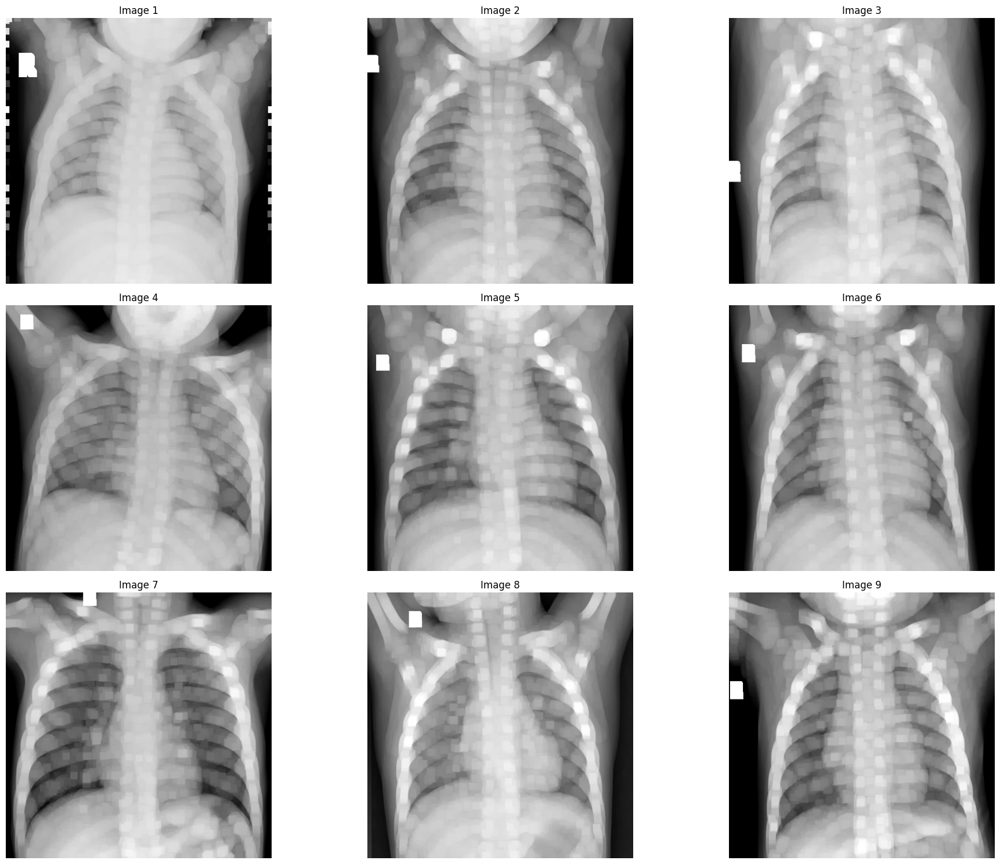

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
image_dir = train_normal_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]

if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows =
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        kernel = np.ones((5, 5), np.uint8)
        dilated_img = cv2.dilate(img, kernel, iterations=3)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(dilated_img)
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


**Image Erosion**

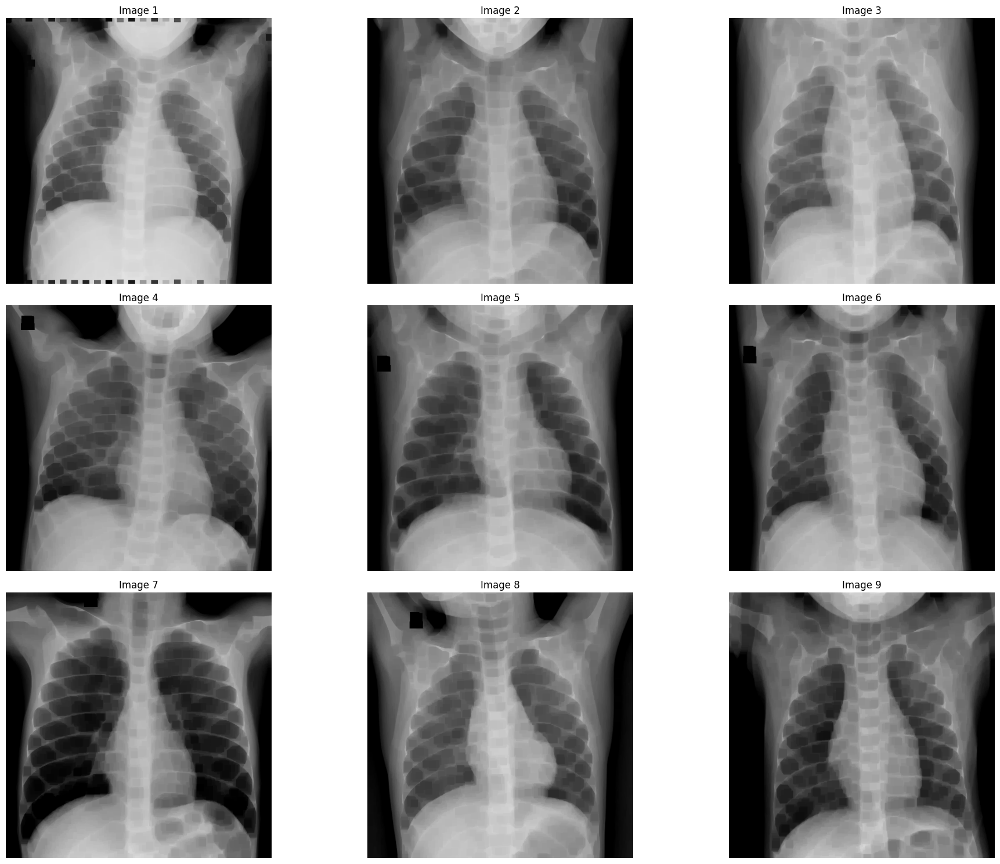

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
image_dir = train_normal_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]
if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows = 3, 3
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        kernel = np.ones((5, 5), np.uint8)
        eroded_img = cv2.erode(img, kernel, iterations=3)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(eroded_img)
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


 **Gaussian blur**

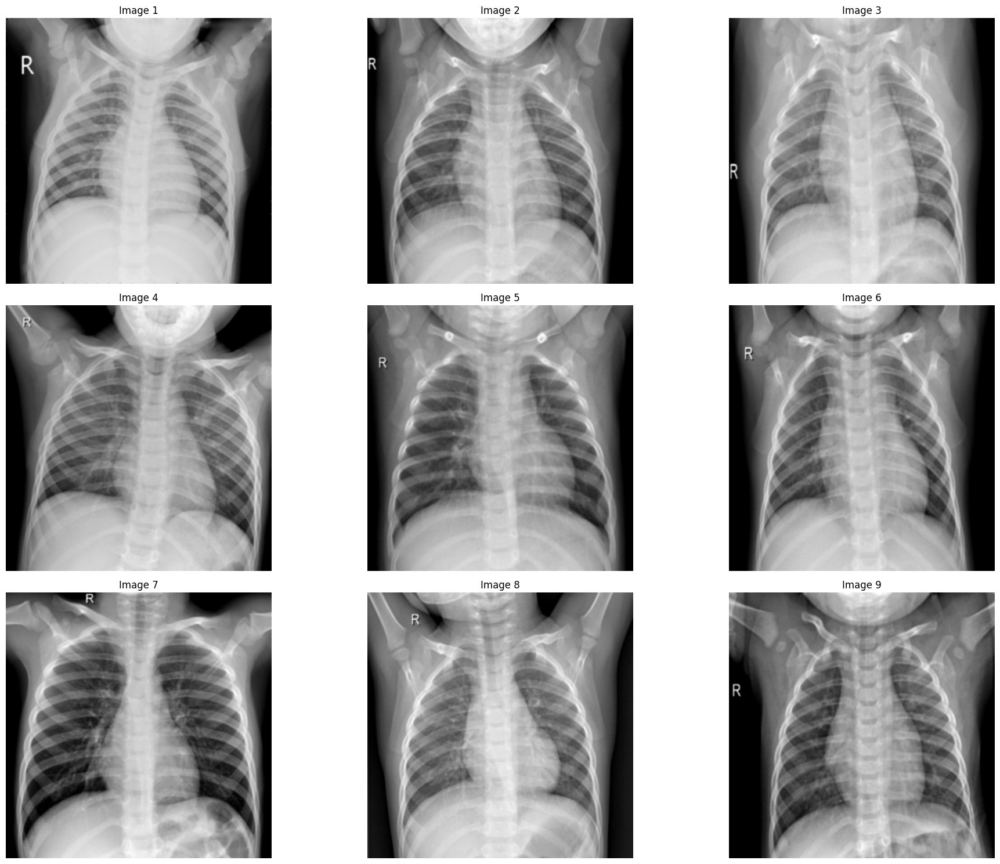

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
image_dir = train_normal_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]
if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows = 3, 3
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blurred_img = cv2.GaussianBlur(gray_img, (5, 5), 0)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(blurred_img, cmap='gray')
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


**Canny Edge Detection**

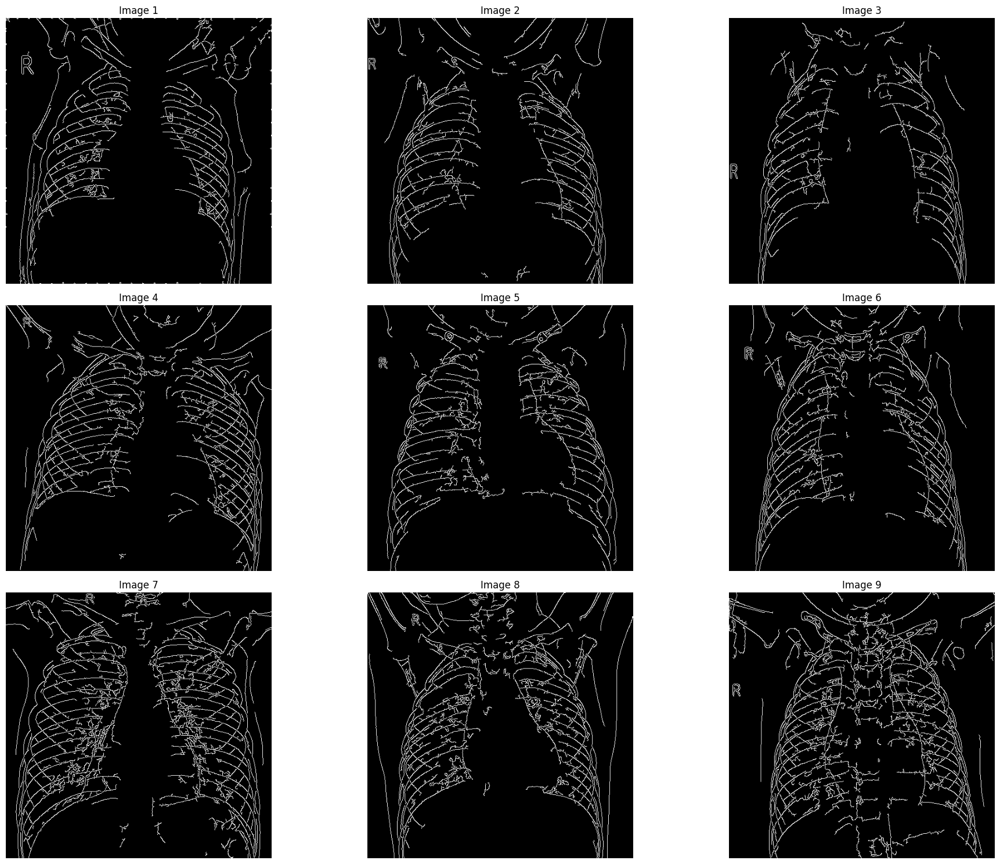

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
image_dir = train_normal_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]
if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows = 3, 3
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(gray_img, threshold1=50, threshold2=150)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(edges, cmap='gray')
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


**PNEUMONIA**

**Image Dilation**

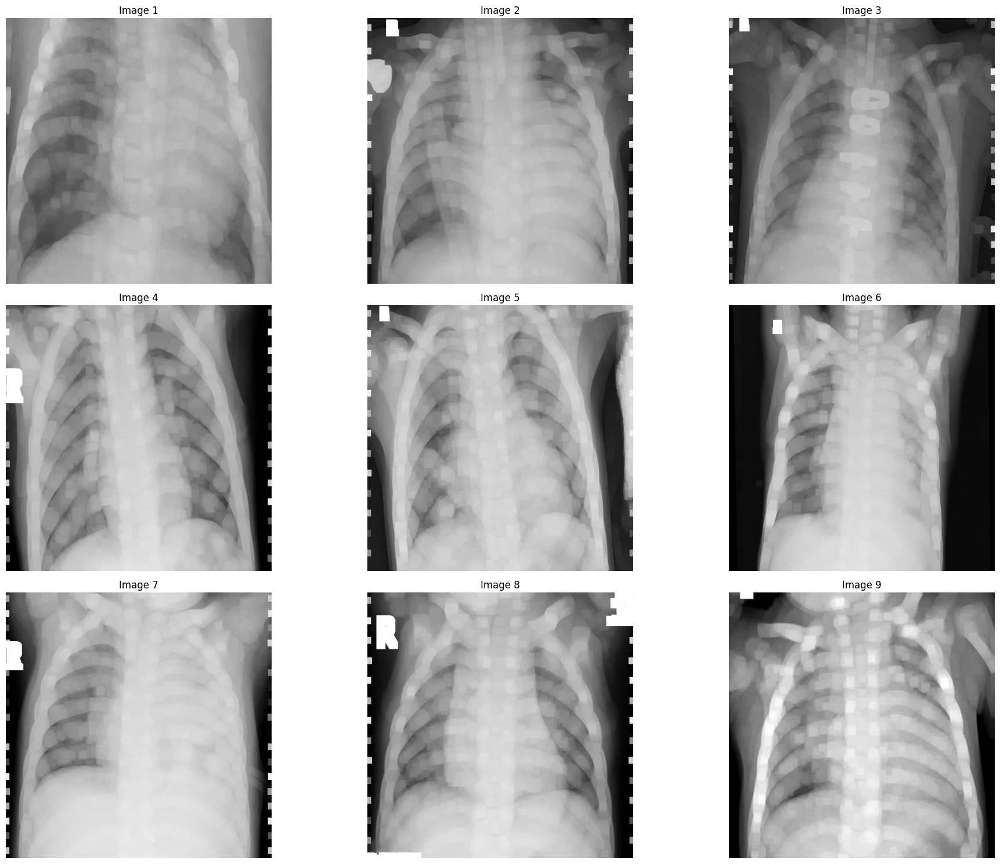

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
image_dir = train_pneumonia_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]
if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows = 3, 3
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        kernel = np.ones((5, 5), np.uint8)
        dilated_img = cv2.dilate(img, kernel, iterations=3)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(dilated_img)
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


**Image Erosion**

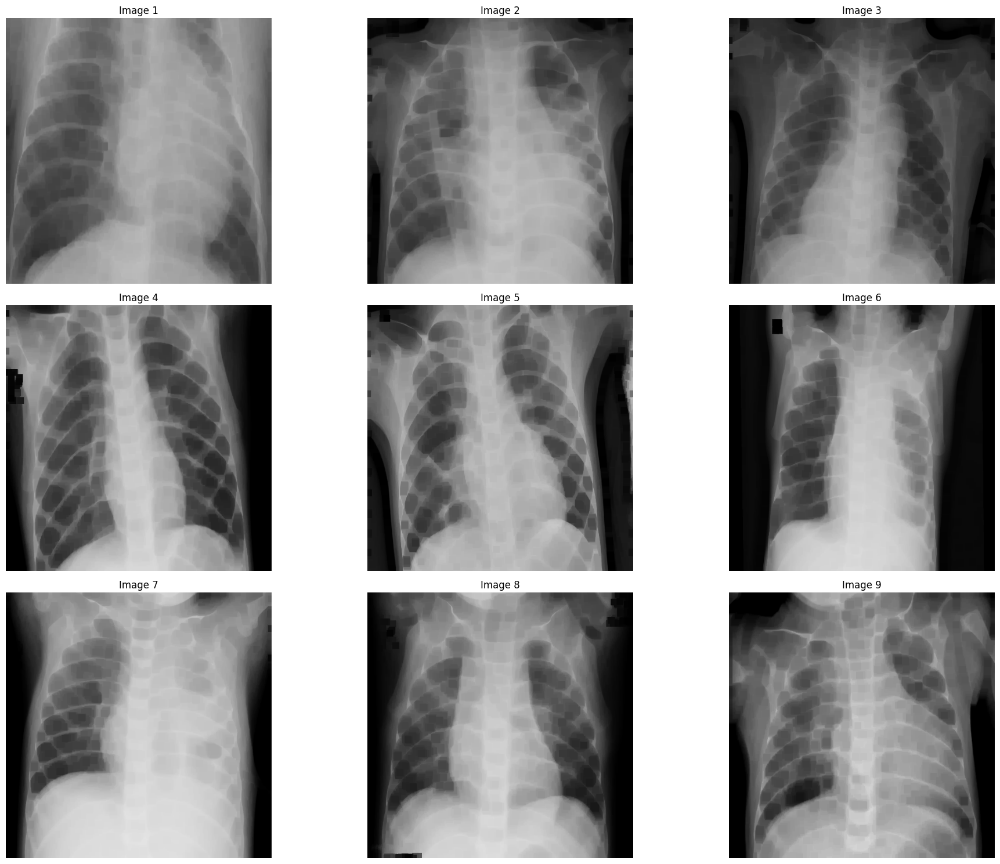

In [ ]:

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
image_dir = train_pneumonia_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]
if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows = 3, 3
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        kernel = np.ones((5, 5), np.uint8)
        eroded_img = cv2.erode(img, kernel, iterations=3)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(eroded_img)
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


**Gaussian blur**

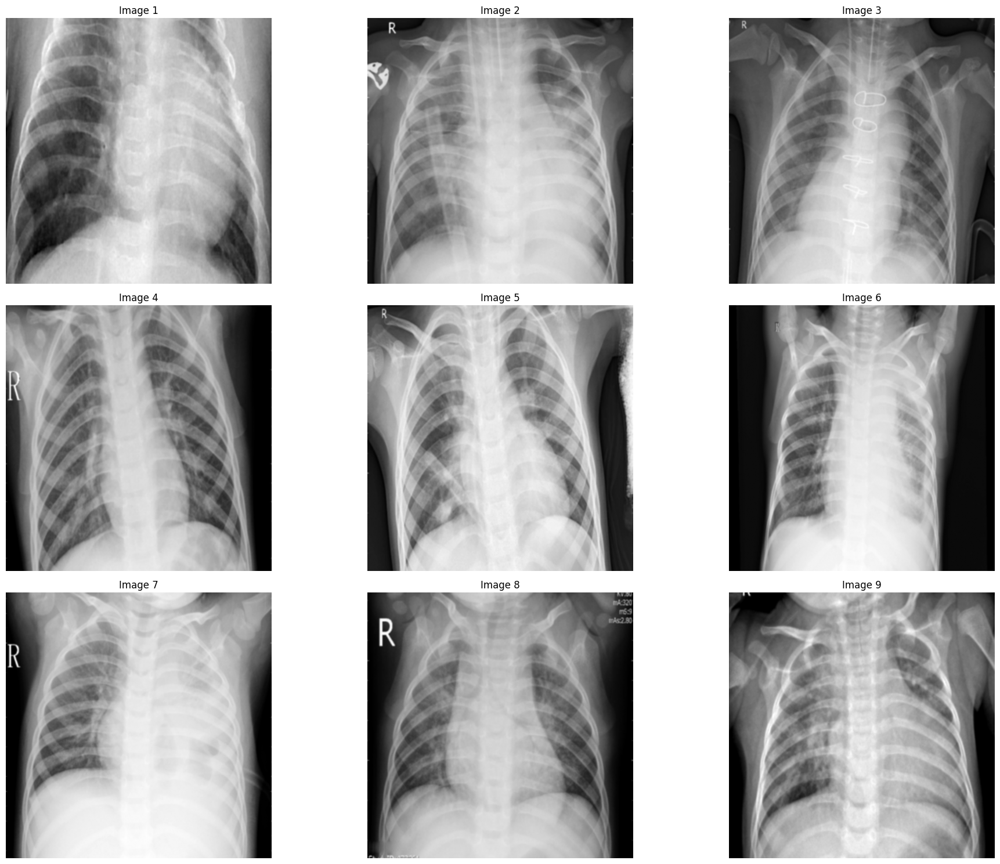

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
image_dir = train_pneumonia_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]
if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows = 3, 3
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blurred_img = cv2.GaussianBlur(gray_img, (5, 5), 0)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(blurred_img, cmap='gray')
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


**Canny Edge Detection**

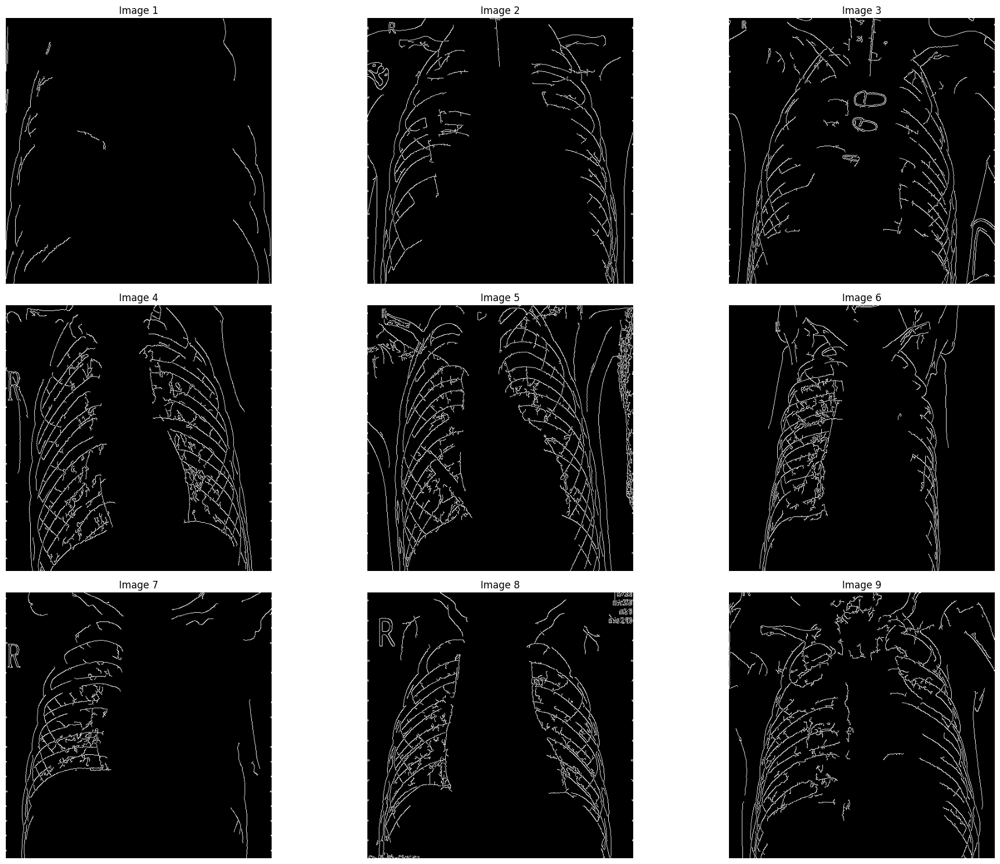

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
image_dir = train_pneumonia_dir
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]
if len(image_files) < 9:
    print(f"Not enough images in the directory. Found {len(image_files)}, but need at least 9.")
else:
    fig = plt.figure(figsize=(20, 15))
    columns, rows = 3, 3
    for i in range(9):
        image_path = os.path.join(image_dir, image_files[i])
        img = cv2.imread(image_path)
        img = cv2.resize(img, (512, 512))
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(gray_img, threshold1=50, threshold2=150)
        fig.add_subplot(rows, columns, i + 1)
        plt.imshow(edges, cmap='gray')
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale = 1/255.,
    horizontal_flip = True,
    vertical_flip = True,
    rotation_range = 0.3,
    zca_whitening = True,
    width_shift_range = 0.25,
    height_shift_range = 0.25,
    channel_shift_range = 0.35,
    shear_range = 0.2,
    zoom_range = 0.4
)

val_test_datagen = ImageDataGenerator(rescale = 1./255)
train_set = train_datagen.flow_from_directory(train_dir, class_mode = "binary", batch_size = 16, target_size = (224, 224))
validation_set = val_test_datagen.flow_from_directory(val_dir, class_mode = "binary", batch_size = 16, target_size = (224, 224))
test_set = val_test_datagen.flow_from_directory(test_dir, class_mode = "binary", batch_size = 16, target_size = (224, 224))


Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1047: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn(


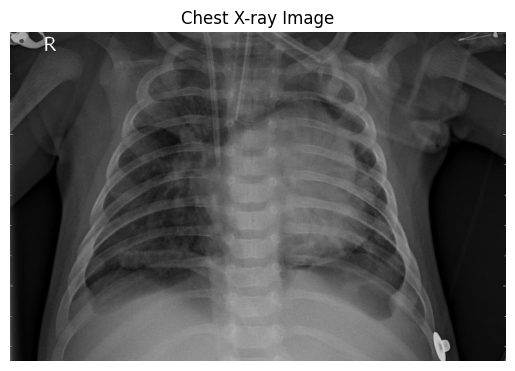

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_path = "/content/person100_bacteria_477.jpeg"
img = mpimg.imread(image_path)
plt.imshow(img, cmap='gray')
plt.title("Chest X-ray Image")
plt.axis("off")
plt.show()


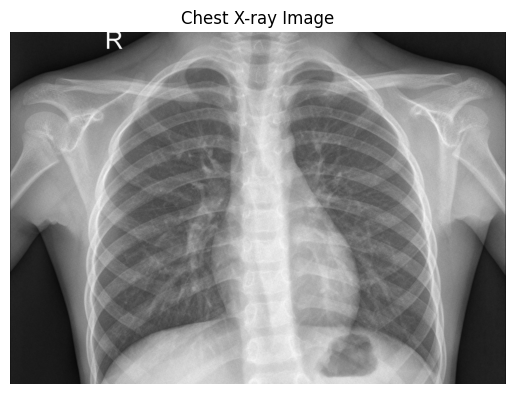

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_path = "/content/normal.jpeg"
img = mpimg.imread(image_path)
plt.imshow(img, cmap='gray')
plt.title("Chest X-ray Image")
plt.axis("off")
plt.show()

**Convolutional neural networks - CNNs**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

model1 = Sequential()
model1.add(Conv2D(32, (3,3), strides = (1, 1),activation = "relu", padding = "same", input_shape = (224, 224, 3)))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Conv2D(64, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Dropout(0.2))
model1.add(Conv2D(128, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Conv2D(256, (3,3), strides = (1, 1), padding = "same", activation = "relu"))
model1.add(MaxPooling2D(pool_size = (2, 2)))
model1.add(Dropout(0.2))
model1.add(Flatten())
model1.add(Dense(128, activation = "relu"))
model1.add(Dense(64, activation = "relu"))
model1.add(Dense(32, activation = "relu"))
model1.add(Dense(1, activation = "sigmoid"))
model1.summary()



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       6,422,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,821,441 (26.02 MB)

 Trainable params: 6,821,441 (26.02 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model1.compile(optimizer = "rmsprop", loss = "binary_crossentropy", metrics = ["accuracy"])

In [ ]:

import tensorflow


early_stopping_callbacks = tensorflow.keras.callbacks.EarlyStopping(patience = 15,
                                                                    restore_best_weights = True,
                                                                    verbose = 1)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator


history = model1.fit(train_set, epochs = 20,
                              validation_data = validation_set,
                              steps_per_epoch = 100,
                              callbacks = [early_stopping_callbacks])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1286: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 323ms/step - accuracy: 0.6824 - loss: 0.8910 - val_accuracy: 0.5000 - val_loss: 0.6878
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 30s 302ms/step - accuracy: 0.7662 - loss: 0.4475 - val_accuracy: 0.5625 - val_loss: 0.6478
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 31s 309ms/step - accuracy: 0.7965 - loss: 0.4301 - val_accuracy: 0.5625 - val_loss: 0.7649
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8075 - loss: 0.4008 - val_accuracy: 0.6250 - val_loss: 0.6200
Epoch 5/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


100/100 ━━━━━━━━━━━━━━━━━━━━ 66s 305ms/step - accuracy: 0.8116 - loss: 0.3770 - val_accuracy: 0.6250 - val_loss: 0.8502
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 30s 297ms/step - accuracy: 0.8361 - loss: 0.3971 - val_accuracy: 0.7500 - val_loss: 0.6902
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 30s 304ms/step - accuracy: 0.8588 - loss: 0.3461 - val_accuracy: 0.7500 - val_loss: 0.7456
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8176 - loss: 0.3242 - val_accuracy: 0.5625 - val_loss: 1.4531
Epoch 9/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 75s 312ms/step - accuracy: 0.8405 - loss: 0.3781 - val_accuracy: 0.5625 - val_loss: 0.7359
Epoch 10/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 31s 309ms/step - accuracy: 0.8305 - loss: 0.3407 - val_accuracy: 0.7500 - val_loss: 0.5823
Epoch 11/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 30s 306ms/step - accuracy: 0.8498 - loss: 0.3155 - val_accuracy: 0.6875 - val_loss: 0.9403
Epoch 12/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - accuracy: 0.8575 - loss: 0.3225 - val_

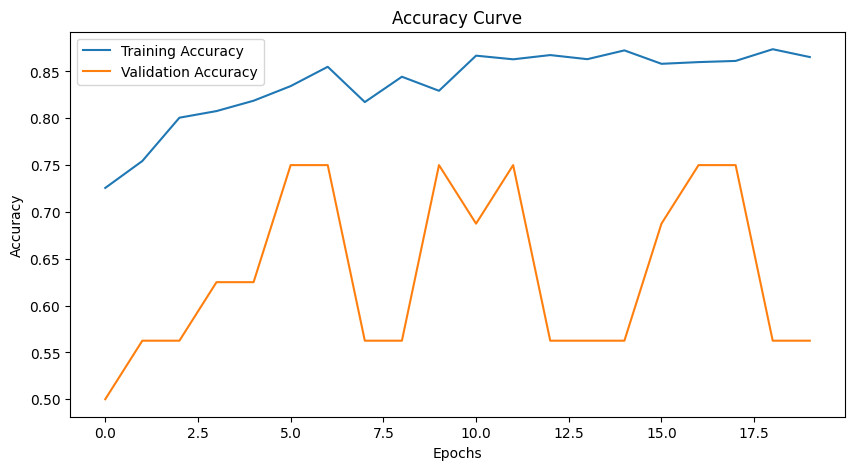

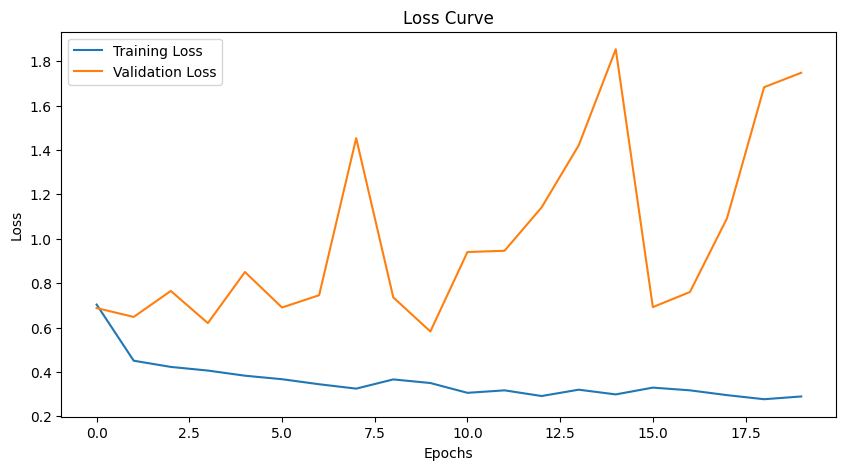

In [ ]:

import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Curve')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
# Evaluate on the test set
test_loss, test_accuracy = model1.evaluate(test_set)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")


39/39 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - accuracy: 0.8361 - loss: 0.4383
Test Loss: 0.4229361116886139
Test Accuracy: 0.8445512652397156


**Testing**

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/normal.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
test_image = test_image / 255.0
result = model1.predict(test_image)
if result[0][0] > 0.5:
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step
Prediction: N O R M A L


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/person100_bacteria_477.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
test_image = test_image / 255.0
result = model1.predict(test_image)
if result[0][0] > 0.5:
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Prediction: P N E U M O N I A


**VGG16**

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense

base_model1 = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3), pooling="max", classes=2)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
base_model1.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d                 │ (None, 512)                 │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_vgg = Sequential()
model_vgg.add(base_model1)
model_vgg.add(Flatten())

model_vgg.add(Dense(128, activation="relu"))
model_vgg.add(Dense(64, activation="relu"))
model_vgg.add(Dense(32, activation="relu"))
model_vgg.add(Dense(1, activation="sigmoid"))

# Freeze the layers
for layer in base_model1.layers:
    layer.trainable = False

model_vgg.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])


In [ ]:
history = model_vgg.fit(
    train_set,
    epochs=20,
    validation_data=validation_set,
    steps_per_epoch=100,
    callbacks=[early_stopping_callbacks]
)


Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 45s 359ms/step - accuracy: 0.7413 - loss: 0.5329 - val_accuracy: 0.7500 - val_loss: 0.5635
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 32s 324ms/step - accuracy: 0.8348 - loss: 0.3502 - val_accuracy: 0.7500 - val_loss: 0.7040
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 331ms/step - accuracy: 0.8529 - loss: 0.3197 - val_accuracy: 0.7500 - val_loss: 0.7160
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - accuracy: 0.8611 - loss: 0.2836 - val_accuracy: 0.7500 - val_loss: 0.6632
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 32s 319ms/step - accuracy: 0.8767 - loss: 0.2708 - val_accuracy: 0.7500 - val_loss: 0.4861
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 334ms/step - accuracy: 0.9040 - loss: 0.2329 - val_accuracy: 0.7500 - val_loss: 0.7250
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 333ms/step - accuracy: 0.8789 - loss: 0.2713 - val_accuracy: 0.7500 - val_loss: 0.5057
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.9055 - loss: 0.241

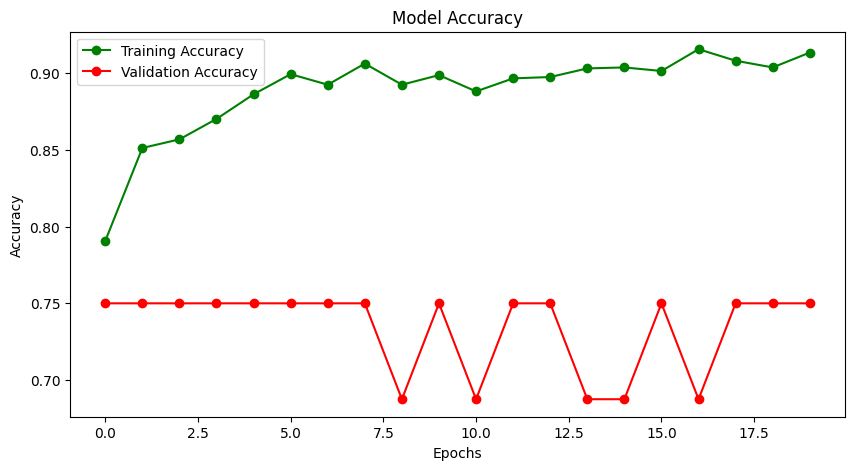

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.title("Model Accuracy")
plt.plot(history.history["accuracy"], "go-", label="Training Accuracy")
plt.plot(history.history["val_accuracy"], "ro-", label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
test_loss, test_accuracy = model_vgg.evaluate(test_set, steps=50)
print("The testing accuracy is: {:.2f}%".format(test_accuracy * 100))
print("The testing loss is: {:.2f}%".format(test_loss * 100))


50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8090 - loss: 0.3719
The testing accuracy is: 80.93%
The testing loss is: 38.22%


**Testing**

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/normal.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
test_image = test_image / 255.0
result = model_vgg.predict(test_image)
if result[0][0] > 0.5:
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Prediction: N O R M A L


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/person100_bacteria_477.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
test_image = test_image / 255.0
result = model_vgg.predict(test_image)
if result[0][0] > 0.5:
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Prediction: P N E U M O N I A


**VGG19**

In [ ]:
from tensorflow.keras.applications import VGG19

# Load the VGG19 base model
base_model_vgg19 = VGG19(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3),
    pooling="max"
)
model_vgg19 = Sequential()
model_vgg19.add(base_model_vgg19)
model_vgg19.add(Flatten())
model_vgg19.add(Dense(128, activation="relu"))
model_vgg19.add(Dense(64, activation="relu"))
model_vgg19.add(Dense(32, activation="relu"))
model_vgg19.add(Dense(1, activation="sigmoid"))
for layer in base_model_vgg19.layers:
    layer.trainable = False
model_vgg19.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
history_vgg19 = model_vgg19.fit(
    train_set,
    epochs=20,
    validation_data=validation_set,
    steps_per_epoch=100,
    callbacks=[early_stopping_callbacks]
)


Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 358ms/step - accuracy: 0.7436 - loss: 0.5123 - val_accuracy: 0.6250 - val_loss: 0.8709
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 333ms/step - accuracy: 0.8208 - loss: 0.3716 - val_accuracy: 0.6875 - val_loss: 0.8678
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 34s 342ms/step - accuracy: 0.8325 - loss: 0.3416 - val_accuracy: 0.7500 - val_loss: 0.4870
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - accuracy: 0.8609 - loss: 0.3089 - val_accuracy: 0.6875 - val_loss: 0.5712
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 35s 346ms/step - accuracy: 0.8695 - loss: 0.2901 - val_accuracy: 0.7500 - val_loss: 0.4803
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 34s 342ms/step - accuracy: 0.8937 - loss: 0.2754 - val_accuracy: 0.8125 - val_loss: 0.4574
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 334ms/step - accuracy: 0.8572 - loss: 0.3042 - val_accuracy: 0.7500 - val_loss: 0.7042
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8802 - loss: 0.292

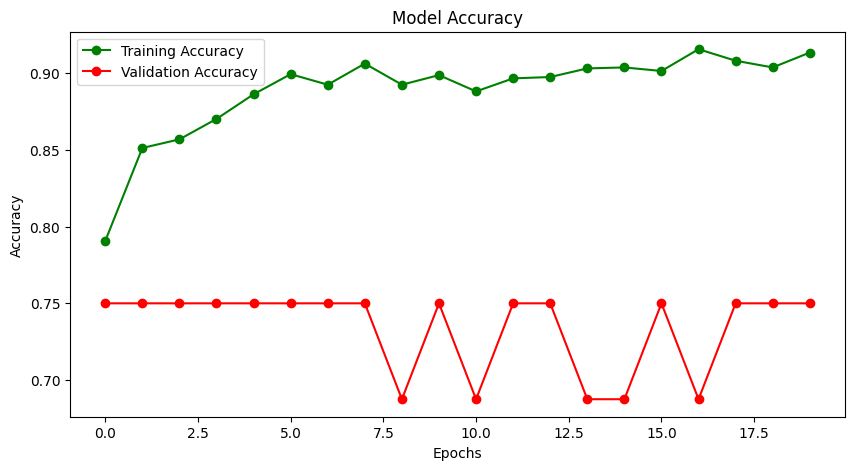

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.title("Model Accuracy")
plt.plot(history.history["accuracy"], "go-", label="Training Accuracy")
plt.plot(history.history["val_accuracy"], "ro-", label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = model_vgg19.evaluate(test_set, steps=50)
print("The testing accuracy is: {:.2f}%".format(test_accuracy * 100))
print("The testing loss is: {:.2f}%".format(test_loss * 100))

50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - accuracy: 0.8224 - loss: 0.3966
The testing accuracy is: 82.85%
The testing loss is: 38.98%


**Testing**

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/normal.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224)) 
test_image = image.img_to_array(test_image)  
test_image = np.expand_dims(test_image, axis=0)  
test_image = test_image / 255.0  
result = model_vgg19.predict(test_image)
if result[0][0] > 0.5:  
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
Prediction: N O R M A L


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/person100_bacteria_477.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))  
test_image = image.img_to_array(test_image)  
test_image = np.expand_dims(test_image, axis=0)  
test_image = test_image / 255.0  
result = model_vgg19.predict(test_image)
if result[0][0] > 0.5: 
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Prediction: P N E U M O N I A


**ResNet50V2**

In [ ]:
from tensorflow.keras.applications import ResNet50V2

base_model_resnet = ResNet50V2(
    include_top=False, weights="imagenet", input_shape=(224, 224, 3), pooling="max"
)

model_resnet = Sequential([
    base_model_resnet,
    Flatten(),
    Dense(128, activation="relu"),
    Dense(64, activation="relu"),
    Dense(32, activation="relu"),
    Dense(1, activation="sigmoid")
])

for layer in base_model_resnet.layers:
    layer.trainable = False

model_resnet.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])


94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
early_stopping_callbacks = tensorflow.keras.callbacks.EarlyStopping(
    patience=15, restore_best_weights=True, verbose=1
)

history_resnet = model_resnet.fit(
    train_set,
    epochs=20,
    validation_data=validation_set,
    steps_per_epoch=100,
    callbacks=[early_stopping_callbacks]
)


Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 48s 358ms/step - accuracy: 0.7404 - loss: 0.9705 - val_accuracy: 0.9375 - val_loss: 0.3751
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 31s 309ms/step - accuracy: 0.9027 - loss: 0.2274 - val_accuracy: 0.8125 - val_loss: 0.2962
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 31s 313ms/step - accuracy: 0.9070 - loss: 0.2331 - val_accuracy: 0.9375 - val_loss: 0.3407
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9016 - loss: 0.2278 - val_accuracy: 0.8750 - val_loss: 0.2450
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 62s 311ms/step - accuracy: 0.8780 - loss: 0.2605 - val_accuracy: 0.8750 - val_loss: 0.3016
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 30s 306ms/step - accuracy: 0.9080 - loss: 0.2236 - val_accuracy: 0.8750 - val_loss: 0.3064
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 32s 318ms/step - accuracy: 0.9136 - loss: 0.1981 - val_accuracy: 0.8750 - val_loss: 0.3501
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.9335 - loss: 0.146

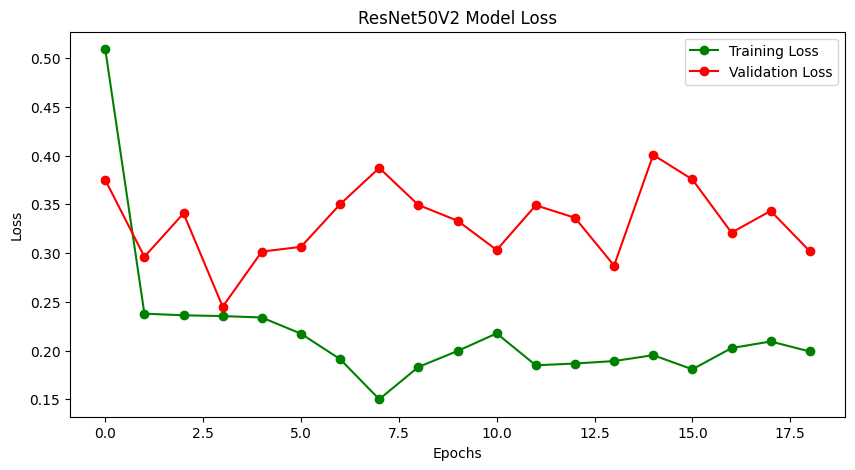

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.title("ResNet50V2 Model Loss")
plt.plot(history_resnet.history["loss"], "go-", label="Training Loss")
plt.plot(history_resnet.history["val_loss"], "ro-", label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()



In [ ]:
test_loss, test_accuracy = model_resnet.evaluate(test_set, steps=50)
print("The testing accuracy is: {:.2f}%".format(test_accuracy * 100))
print("The testing loss is: {:.2f}%".format(test_loss * 100))

50/50 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - accuracy: 0.8941 - loss: 0.2973
The testing accuracy is: 89.42%
The testing loss is: 29.48%


**Testing**

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/person100_bacteria_477.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))  
test_image = image.img_to_array(test_image)  
test_image = np.expand_dims(test_image, axis=0) 
test_image = test_image / 255.0  
result = model_resnet.predict(test_image)
if result[0][0] > 0.5: 
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Prediction: P N E U M O N I A


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/normal.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))  
test_image = image.img_to_array(test_image) 
test_image = np.expand_dims(test_image, axis=0)  
test_image = test_image / 255.0  
result = model_resnet.predict(test_image)
if result[0][0] > 0.5:  
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Prediction: N O R M A L


**InceptionV3**

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Load the InceptionV3 model
base_model_inception = InceptionV3(
    include_top=False,  # Exclude the top dense layers
    weights="imagenet",  # Pretrained on ImageNet
    input_shape=(224, 224, 3),  # Input shape for images
    pooling="max"  # Global max pooling
)

# Build the model
model_inception = Sequential([
    base_model_inception,
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.3),
    Dense(64, activation="relu"),
    Dropout(0.3),
    Dense(32, activation="relu"),
    Dense(1, activation="sigmoid")  # Output layer for binary classification
])

# Freeze the base model layers
for layer in base_model_inception.layers:
    layer.trainable = False

# Compile the model
model_inception.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
model_inception.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)            │ (None, 2048)                │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,075,425 (84.21 MB)

 Trainable params: 272,641 (1.04 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
# Early stopping callback
early_stopping = EarlyStopping(
    patience=10,
    restore_best_weights=True,
    monitor="val_loss",
    verbose=1
)

In [ ]:
# Train the model
history = model_inception.fit(
    train_set,
    validation_data=validation_set,
    epochs=20,
    steps_per_epoch=100,
    callbacks=[early_stopping]
)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 383ms/step - accuracy: 0.6630 - loss: 0.8931 - val_accuracy: 0.5000 - val_loss: 0.6924
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 31s 308ms/step - accuracy: 0.7503 - loss: 0.5223 - val_accuracy: 0.5625 - val_loss: 0.6375
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 31s 317ms/step - accuracy: 0.8083 - loss: 0.4112 - val_accuracy: 0.6875 - val_loss: 0.4817
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - accuracy: 0.8091 - loss: 0.3835 - val_accuracy: 0.7500 - val_loss: 0.4844
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 56s 310ms/step - accuracy: 0.8354 - loss: 0.3649 - val_accuracy: 0.6875 - val_loss: 0.5193
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 31s 315ms/step - accuracy: 0.8347 - loss: 0.3544 - val_accuracy: 0.5625 - val_loss: 0.7523
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 30s 306ms/step - accuracy: 0.8248 - loss: 0.3792 - val_accuracy: 0.8750 - val_loss: 0.4140
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8378 - loss: 0.360

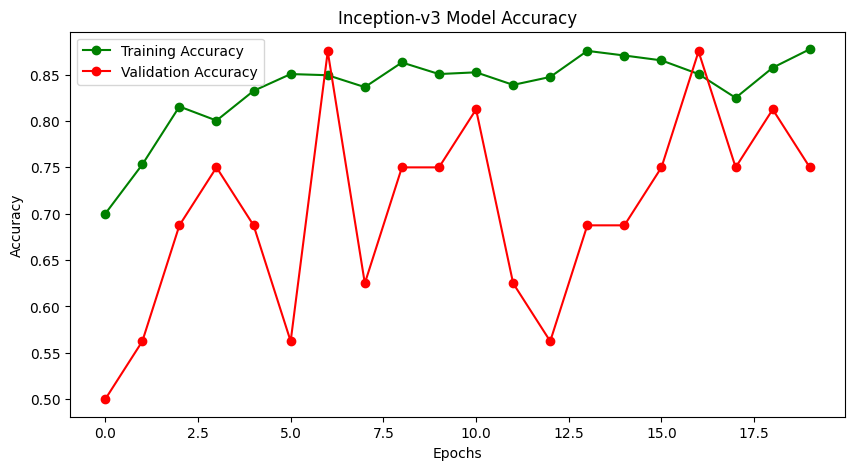

In [ ]:
# Plotting accuracy
plt.figure(figsize=(10, 5))
plt.title("Inception-v3 Model Accuracy")
plt.plot(history.history["accuracy"], "go-", label="Training Accuracy")
plt.plot(history.history["val_accuracy"], "ro-", label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# Evaluate the model
test_loss, test_accuracy = model_inception.evaluate(test_set, steps=50)
print(f"The testing accuracy is: {test_accuracy * 100:.2f}%")
print(f"The testing loss is: {test_loss:.2f}")

50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - accuracy: 0.8279 - loss: 0.4045
The testing accuracy is: 82.53%
The testing loss is: 0.42


**Testing**

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/person100_bacteria_477.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))  
test_image = image.img_to_array(test_image)  
test_image = np.expand_dims(test_image, axis=0)  
test_image = test_image / 255.0  
result = model_inception.predict(test_image)
if result[0][0] > 0.5: 
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Prediction: P N E U M O N I A


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/normal.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))  
test_image = image.img_to_array(test_image)  
test_image = np.expand_dims(test_image, axis=0) 
test_image = test_image / 255.0  
result = model_inception.predict(test_image)
if result[0][0] > 0.5: 
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Prediction: N O R M A L


**InceptionResNetV2**

In [ ]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Load the Inception-ResNet-v2 model
base_model_inception_resnet = InceptionResNetV2(
    include_top=False,  # Exclude the top dense layers
    weights="imagenet",  # Pretrained on ImageNet
    input_shape=(224, 224, 3),  # Input shape for images
    pooling="max"  # Global max pooling
)

# Build the model
model_inception_resnet = Sequential([
    base_model_inception_resnet,
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.3),
    Dense(64, activation="relu"),
    Dropout(0.3),
    Dense(32, activation="relu"),
    Dense(1, activation="sigmoid")  # Output layer for binary classification
])

# Freeze the base model layers
for layer in base_model_inception_resnet.layers:
    layer.trainable = False

# Compile the model
model_inception_resnet.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"]
)
model_inception_resnet.summary()

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inception_resnet_v2 (Functional)     │ (None, 1536)                │      54,336,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 1536)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │         196,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 54,543,841 (208.07 MB)

 Trainable params: 207,105 (809.00 KB)

 Non-trainable params: 54,336,736 (207.28 MB)

In [ ]:
# Early stopping callback
early_stopping = EarlyStopping(
    patience=10,
    restore_best_weights=True,
    monitor="val_loss",
    verbose=1
)


In [ ]:
# Train the model
history = model_inception_resnet.fit(
    train_set,
    validation_data=validation_set,
    epochs=20,
    steps_per_epoch=100,
    callbacks=[early_stopping]
)


Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 76s 461ms/step - accuracy: 0.6757 - loss: 0.9018 - val_accuracy: 0.5000 - val_loss: 0.6378
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 328ms/step - accuracy: 0.7403 - loss: 0.5386 - val_accuracy: 0.8125 - val_loss: 0.4953
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 332ms/step - accuracy: 0.8016 - loss: 0.4371 - val_accuracy: 0.8125 - val_loss: 0.5281
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - accuracy: 0.7567 - loss: 0.4514 - val_accuracy: 0.8125 - val_loss: 0.5628
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 44s 335ms/step - accuracy: 0.7773 - loss: 0.4103 - val_accuracy: 0.6875 - val_loss: 0.5426
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 333ms/step - accuracy: 0.8212 - loss: 0.3733 - val_accuracy: 0.7500 - val_loss: 0.5004
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 330ms/step - accuracy: 0.7833 - loss: 0.3897 - val_accuracy: 0.8125 - val_loss: 0.5420
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8632 - loss: 0.3

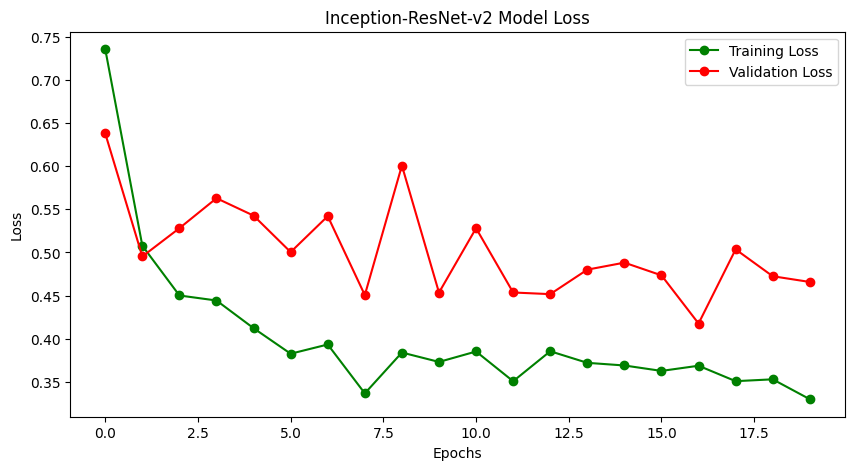

In [ ]:
# Plotting loss
plt.figure(figsize=(10, 5))
plt.title("Inception-ResNet- Model Loss")
plt.plot(history.history["loss"], "go-", label="Training Loss")
plt.plot(history.history["val_loss"], "ro-", label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()


In [ ]:
# Evaluate the model
test_loss, test_accuracy = model_inception_resnet.evaluate(test_set, steps=50)
print(f"The testing accuracy is: {test_accuracy * 100:.2f}%")
print(f"The testing loss is: {test_loss:.2f}")

50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.8068 - loss: 0.4716
The testing accuracy is: 81.09%
The testing loss is: 0.46


**Testing**

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/person100_bacteria_477.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))  
test_image = image.img_to_array(test_image)  
test_image = np.expand_dims(test_image, axis=0) 
test_image = test_image / 255.0  
result = model_inception_resnet.predict(test_image)
if result[0][0] > 0.5: 
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
Prediction: P N E U M O N I A


In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
new_image_path = r"/content/normal.jpeg"
test_image = image.load_img(new_image_path, target_size=(224, 224))  
test_image = image.img_to_array(test_image)  
test_image = np.expand_dims(test_image, axis=0)  
test_image = test_image / 255.0 
result = model_inception_resnet.predict(test_image)
if result[0][0] > 0.5: 
    prediction = "P N E U M O N I A"
else:
    prediction = "N O R M A L"

print(f"Prediction: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Prediction: N O R M A L


**COMPARISON OF ALL  MODELS**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


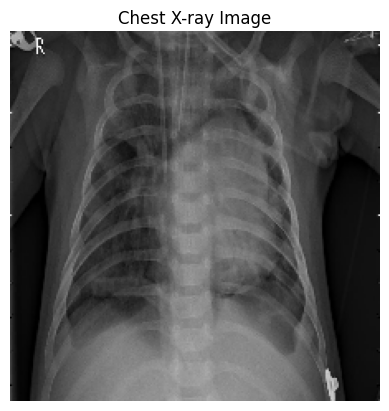

This image is 81.402% P N E U M O N I A


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0) 
    test_image = test_image / 255.0  

    # Make a prediction using the already trained model
    prediction = model_resnet.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/person100_bacteria_477.jpeg", model_resnet)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


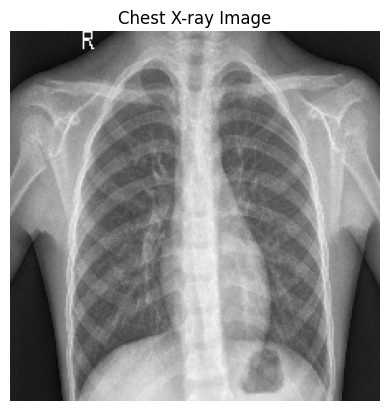

This image is 95.163% N O R M A L


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_resnet.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/normal.jpeg", model_resnet)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


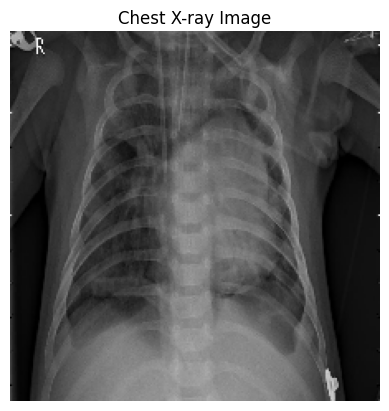

This image is 83.455% P N E U M O N I A


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_vgg19 .predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")
 
# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/person100_bacteria_477.jpeg", model_vgg19)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


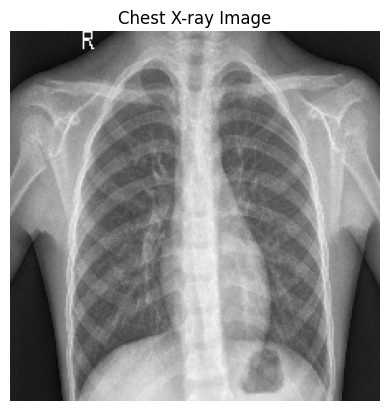

This image is 93.997% N O R M A L


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_vgg19 .predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/normal.jpeg", model_vgg19)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


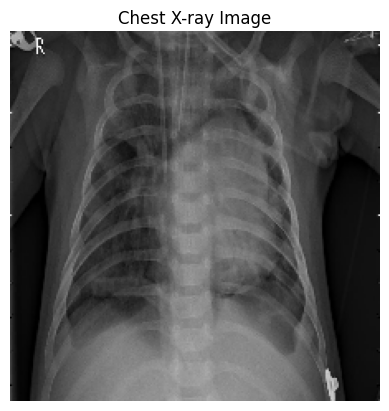

This image is 78.592% P N E U M O N I A


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_vgg.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/person100_bacteria_477.jpeg", model_vgg)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


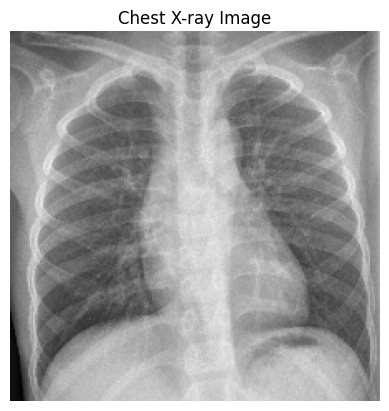

This image is 93.464% N O R M A L


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_vgg.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/IM-0006-0001.jpeg", model_vgg19)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


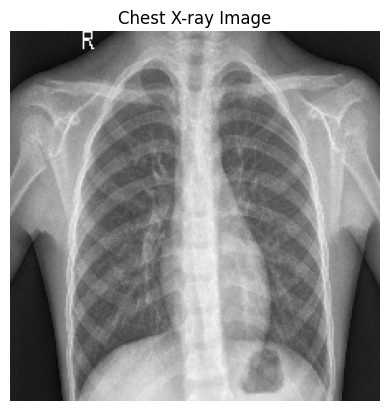

This image is 61.894% N O R M A L


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_inception_resnet.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/normal.jpeg",model_inception_resnet)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


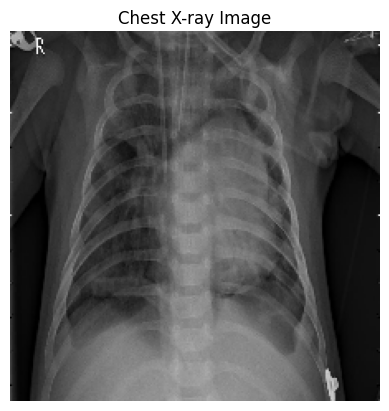

This image is 67.563% P N E U M O N I A


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_inception_resnet.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/person100_bacteria_477.jpeg",model_inception_resnet)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


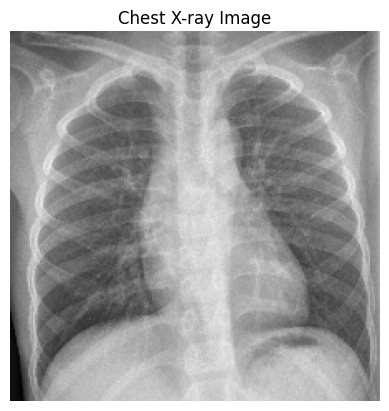

This image is 56.471% N O R M A L


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_inception.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/IM-0006-0001.jpeg",model_inception)  # Use your trained model


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


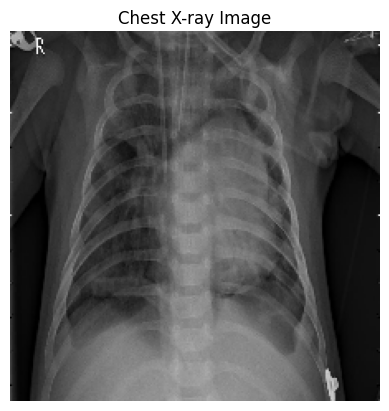

This image is 83.137% P N E U M O N I A


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def image_prediction(new_image_path, model):
    # Load and preprocess the image
    test_image = image.load_img(new_image_path, target_size=(224, 224))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    test_image = test_image / 255.0  # Normalize pixel values

    # Make a prediction using the already trained model
    prediction = model_inception.predict(test_image)[0][0]

    # Display the image
    plt.imshow(image.load_img(new_image_path, target_size=(224, 224)), cmap='gray')
    plt.axis('off')
    plt.title("Chest X-ray Image")
    plt.show()

    # Interpret the result
    confidence = prediction * 100 if prediction > 0.5 else (1.0 - prediction) * 100
    label = "P N E U M O N I A" if prediction > 0.5 else "N O R M A L"

    # Print result with confidence
    print(f"This image is {confidence:.3f}% {label}")

# Assuming you have a trained model (e.g., model_vgg19, model_resnet, etc.)
image_prediction("/content/person100_bacteria_477.jpeg",model_inception)  # Use your trained model


In [ ]:
model1